案例：xiaohongshu

## 分析背景
说到小红书，是目前非常热门的电商平台，和其他电商平台不同，小红书是从社区起家。在小红书社区，用户通过文字、图片、视频笔记的分享，记录了这个时代年轻人的正能量和美好生活。

小红书通过机器学习对海量信息和人进行精准、高效匹配，已累积海量的海外购物数据，分析出最受欢迎的商品及全球购物趋势，并在此基础上把全世界的好东西，以最短的路径、最简洁的方式提供给用户。

本项目协助小红书分析不同的业务决策所带来的销售额变化。

## 分析目标
根据用户数据以及消费行为数据

- 使用Python建立线性回归模型
- 预测用户的消费金额变化
- 找到对用户消费影响较大的因素


## 分析流程

# 1 数据概况分析

### 指标解释
- revenue：用户的下单购买金额
- 3rd_party_stores：用户过往在app中从第三方商家购买的数量，0表示购买的自营产品
- gender：男1，女0，空缺unkown
- age：年龄，空缺unkown
- engaged_last_30：最近30天在app上有参与重点活动
- lifecycle：生命周期A：注册6个月内; B：一年内; C：两年内
- days_since_last_order：最近一次下单距今的天数（小于1表示当天有下单）
- previous_order_amount：累计的用户购买金额

In [22]:
#导入模块
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.formula.api import ols
%matplotlib inline

#导入数据
red = pd.read_csv('redNew.csv')
red.head()

,revenue,gender,age,engaged_last_30,lifecycle,days_since_last_order,previous_order_amount,3rd_party_stores
0,72.98,1.0,59.0,0.0,B,4.26,2343.870,0
1,200.99,1.0,51.0,0.0,A,0.94,8539.872,0
2,69.98,1.0,79.0,0.0,C,4.29,1687.646,1
3,649.99,NaN,NaN,NaN,C,14.90,3498.846,0
4,83.59,NaN,NaN,NaN,C,21.13,3968.490,4


In [14]:
#查看数据信息
red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29452 entries, 0 to 29451
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   revenue                  29452 non-null  float64
 1   gender                   17723 non-null  float64
 2   age                      16716 non-null  float64
 3   engaged_last_30          17723 non-null  float64
 4   lifecycle                29452 non-null  object 
 5    days_since_last_order   29452 non-null  float64
 6   previous_order_amount    29452 non-null  float64
 7   3rd_party_stores         29452 non-null  int64  
dtypes: float64(6), int64(1), object(1)
memory usage: 1.8+ MB


结果显示共有29452行数据，其中gender, age, engaged_last_30三列有缺失值，需要对其进行数据处理

In [15]:
#查看缺失值占总数的比值
red.isnull().sum()/red.count()

revenue                    0.000000
gender                     0.661795
age                        0.761905
engaged_last_30            0.661795
lifecycle                  0.000000
 days_since_last_order     0.000000
previous_order_amount      0.000000
3rd_party_stores           0.000000
dtype: float64

缺失值占比约为70%，不能直接删除缺失值，否则会损失非常多的数据

In [16]:
#了解数据分布
red.describe()

,revenue,gender,age,engaged_last_30,days_since_last_order,previous_order_amount,3rd_party_stores
count,29452.000000,17723.000000,16716.000000,17723.000000,29452.000000,29452.000000,29452.000000
mean,398.288037,0.950742,60.397404,0.073069,7.711348,2348.904830,2.286059
std,960.251728,0.216412,14.823026,0.260257,6.489289,2379.774213,3.538219
min,0.020000,0.000000,18.000000,0.000000,0.130000,0.000000,0.000000
25%,74.970000,1.000000,50.000000,0.000000,2.190000,773.506250,0.000000
50%,175.980000,1.000000,60.000000,0.000000,5.970000,1655.980000,0.000000
75%,499.990000,1.000000,70.000000,0.000000,11.740000,3096.766500,3.000000
max,103466.100000,1.000000,99.000000,1.000000,23.710000,11597.900000,10.000000


In [66]:
#对于连续变量，可以用均值、中位数或者根据其他数据模型填充；
#对于类别变量，则可以把变量拆解为哑变量，再删除重复或没有意义的变量
#gender是类别型变量，先把缺失值填充为unknown
#即将gender拆解为gender_0, gender_1, gender_unknown, 每个变量用0/1表示
red['gender'] = red['gender'].fillna('unknown')

In [67]:
#engaged_last_30是类别型变量，也把缺失值填充为unknown
red['engaged_last_30'] = red['engaged_last_30'].fillna('unknown')

In [68]:
#类别型变量填充完毕后，剩下的连续型变量均可用均值填充和进行哑变量处理
#age是连续变量，用均值填充
red = red.fillna(red.mean())
red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29452 entries, 0 to 29451
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   revenue                  29452 non-null  float64
 1   gender                   29452 non-null  object 
 2   age                      29452 non-null  float64
 3   engaged_last_30          29452 non-null  object 
 4   lifecycle                29452 non-null  object 
 5    days_since_last_order   29452 non-null  float64
 6   previous_order_amount    29452 non-null  float64
 7   3rd_party_stores         29452 non-null  int64  
dtypes: float64(4), int64(1), object(3)
memory usage: 1.8+ MB


In [73]:
#对gender, engaged_last_30, lifecycle进行哑变量处理
red = pd.get_dummies(red)
red.head()

,revenue,age,days_since_last_order,previous_order_amount,3rd_party_stores,gender_0.0,gender_1.0,gender_unknown,engaged_last_30_0.0,engaged_last_30_1.0,engaged_last_30_unknown,lifecycle_A,lifecycle_B,lifecycle_C
0,72.98,59.000000,4.26,2343.870,0,0,1,0,1,0,0,0,1,0
1,200.99,51.000000,0.94,8539.872,0,0,1,0,1,0,0,1,0,0
2,69.98,79.000000,4.29,1687.646,1,0,1,0,1,0,0,0,0,1
3,649.99,60.397404,14.90,3498.846,0,0,0,1,0,0,1,0,0,1
4,83.59,60.397404,21.13,3968.490,4,0,0,1,0,0,1,0,0,1


In [70]:
#把 days_since_last_order 前面的空格删掉
red.rename(columns = {' days_since_last_order ':'days_since_last_order'}, inplace = True)
red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29452 entries, 0 to 29451
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   revenue                  29452 non-null  float64
 1   age                      29452 non-null  float64
 2   days_since_last_order    29452 non-null  float64
 3   previous_order_amount    29452 non-null  float64
 4   3rd_party_stores         29452 non-null  int64  
 5   gender_0.0               29452 non-null  uint8  
 6   gender_1.0               29452 non-null  uint8  
 7   gender_unknown           29452 non-null  uint8  
 8   engaged_last_30_0.0      29452 non-null  uint8  
 9   engaged_last_30_1.0      29452 non-null  uint8  
 10  engaged_last_30_unknown  29452 non-null  uint8  
 11  lifecycle_A              29452 non-null  uint8  
 12  lifecycle_B              29452 non-null  uint8  
 13  lifecycle_C              29452 non-null  uint8  
dtypes: float64(4), int64(1

# 2 单变量分析

## 2.1 数字型变量

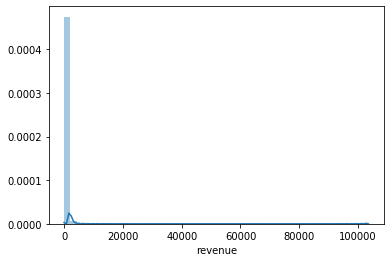

In [136]:
#用户下单金额revenue
sns.distplot(red['revenue'])

集中分布在0-200之间

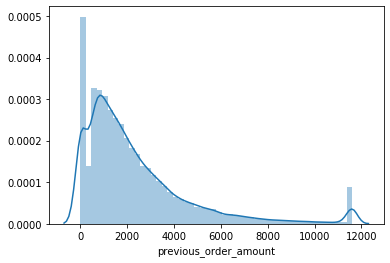

In [37]:
#用户以往累积购买金额previous_order_amount
sns.distplot(red['previous_order_amount'])

用户以往累积金额为0-100的频数较高

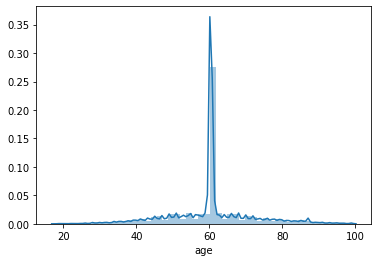

In [38]:
#年龄age
sns.distplot(red['age'])

In [40]:
#年龄age的数据分布
red['age'].describe()

count    29452.000000
mean        60.397404
std         11.167091
min         18.000000
25%         58.000000
50%         60.397404
75%         62.000000
max         99.000000
Name: age, dtype: float64

- 用户年龄分布在18 - 99岁之间，用户年龄平均值为60.39岁，用户年龄中位数为60.39岁，绝大部分用户年龄集中在58 = 63岁之间
- 用户年龄在平均值两侧呈对称分布
- 29452个用户的年龄为60.3岁，60岁或是小红书的默认年龄选项

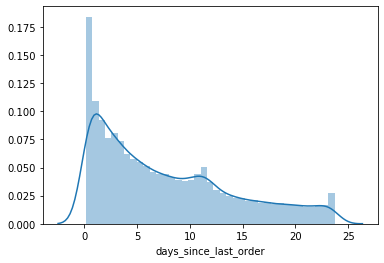

In [43]:
#用户最近一次下单距今的天数days_since_last_order
sns.distplot(red['days_since_last_order'])

In [45]:
red['days_since_last_order'].describe()

count    29452.000000
mean         7.711348
std          6.489289
min          0.130000
25%          2.190000
50%          5.970000
75%         11.740000
max         23.710000
Name: days_since_last_order, dtype: float64

- 用户最近一次下单距今的天数分布在0 - 23天之间，可见所有的用户在本月内都有下单行为
- 用户最近一次下单后平均7.7天后会再次下单
- 用户最近一次下单距今0 - 1天的频数较高

## 2.2 类别型变量

In [23]:
#生命周期lifecycle
#不同生命周期(lifecycle)对应的revenue(销售额)是怎样的
#生命周期，分类为A,B,C（分别对应注册后6个月内，1年内，2年内）
red.groupby(red['lifecycle'])['revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
lifecycle,,,,,,,,
A,3542.0,433.823171,1902.496280,0.02,71.93,170.945,483.8025,103466.10
B,5709.0,381.348012,605.828160,0.10,72.99,179.980,474.9600,21068.17
C,20201.0,396.844800,778.374439,0.02,74.99,174.980,513.9600,62100.00


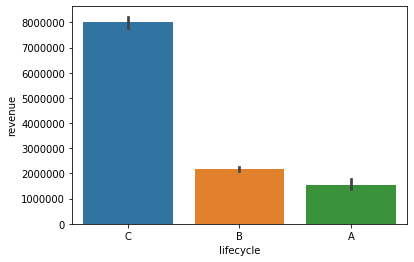

In [11]:
#不同生命周期的销售额总和
sns.barplot(x = 'lifecycle', y = 'revenue', data = red, order = red['lifecycle'].value_counts().index, estimator = sum)

In [24]:
red['lifecycle'].describe()

count     29452
unique        3
top           C
freq      20201
Name: lifecycle, dtype: object

- C(注册后两年)的用户最多
- A(注册后6个月内的)用户销售额平均值最高，为433.8；其次是C(注册后两年)用户，销售额平均值为396.8；销售额平均值最低的是B(注册后一年内的)用户，销售额平均值为381.3
- C用户销售额总和最高,其次是B用户,销售额总和最低的是A用户.
- 总销售额大部分由C的用户创造


In [31]:
#不同性别(gender)对应的revenue(销售额)是怎样的
red.groupby(red['gender'])['revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
gender,,,,,,,,
0.0,873.0,316.346802,566.606482,4.99,69.99,139.98,355.97000,11169.72
1.0,16850.0,387.972592,655.523780,0.02,73.16,175.98,494.20575,29080.80
unknown,11729.0,419.206270,1293.523770,0.02,75.96,179.00,528.99000,103466.10


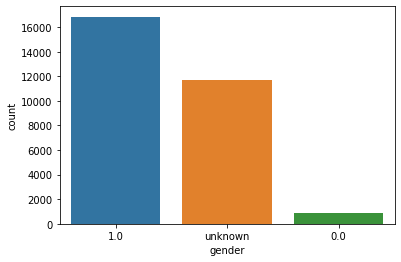

In [33]:
#不同性别计数
sns.countplot(x = 'gender', data = red, order = red['gender'].value_counts().index)

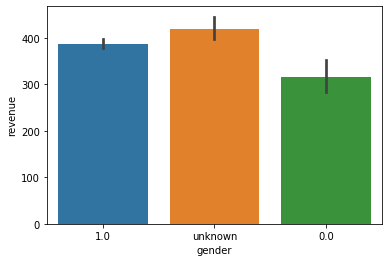

In [39]:
#不同性别的销售额平均值
#barplot() 默认展示的是某种变量分布的平均值（可通过参数修改为max、median 等）
sns.barplot(x = 'gender', y = 'revenue', data = red)

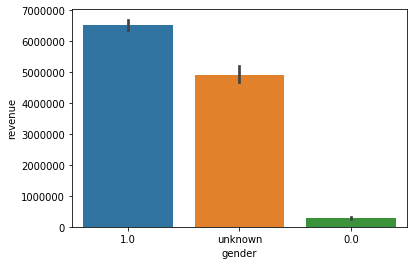

In [49]:
#不同性别的销售额总和
sns.barplot(x = 'gender', y = 'revenue', data = red, estimator = sum)

- 男性顾客远远超过女性顾客数量
- 男性顾客的销售额平均值比女性顾客的消费额平均值略高
- 总销售额大部分由男性顾客贡献

In [51]:
#最近30天在APP上参与重要活动与否对应的销售额是怎样的
red.groupby(['engaged_last_30'])['revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
engaged_last_30,,,,,,,,
0.0,16428.0,369.839618,579.590923,0.02,71.18,160.37,469.98,22214.92
1.0,1295.0,569.717137,1230.162096,1.00,109.99,299.99,674.08,29080.80
unknown,11729.0,419.206270,1293.523770,0.02,75.96,179.00,528.99,103466.10


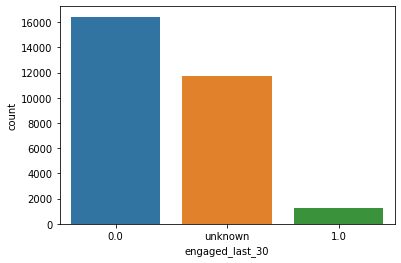

In [53]:
#不同类别计数
sns.countplot(x = 'engaged_last_30', data = red, order = red['engaged_last_30'].value_counts().index)

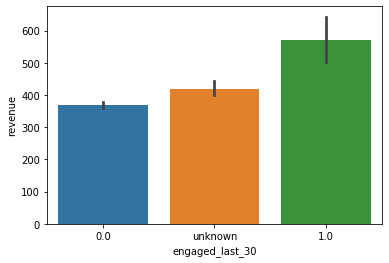

In [54]:
#最近30天在APP上参与重要活动与否对应的销售额平均值
sns.barplot(x = 'engaged_last_30', y = 'revenue', data = red)

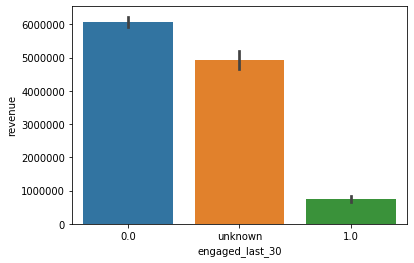

In [55]:
#最近30天在APP上参与重要活动与否对应的销售额总和
sns.barplot(x = 'engaged_last_30', y = 'revenue', data = red, estimator = sum)

In [56]:
red['engaged_last_30'].describe()

count     29452.0
unique        3.0
top           0.0
freq      16428.0
Name: engaged_last_30, dtype: float64

- 大部分用户30天内未在APP上参加活动
- 最近30天在APP上参与了活动的用户的销售额平均值更大，为569.7，未参加活动的用户的销售额平均值为369.8元
- 总销售额的大部分由30天内未在APP上参加活动的用户创造

In [58]:
#用户过往在第三方APP购买的数量
red['3rd_party_stores'].describe()

count    29452.000000
mean         2.286059
std          3.538219
min          0.000000
25%          0.000000
50%          0.000000
75%          3.000000
max         10.000000
Name: 3rd_party_stores, dtype: float64

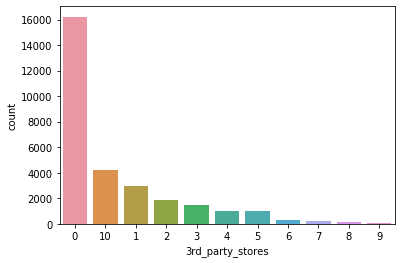

In [62]:
#用户过往在第三方APP购买的数量计数
sns.countplot(x = '3rd_party_stores', data = red, order = red['3rd_party_stores'].value_counts().index)

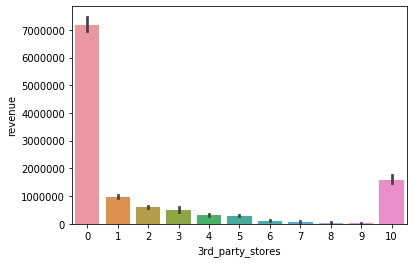

In [64]:
#用户过往在第三方APP购买的数量对应的销售额总和
sns.barplot(x = '3rd_party_stores', y = 'revenue', data = red, estimator = sum)

- 从未在第三方APP购买过的顾客最多，其次是在第三方APP购买过10次的顾客
- 从未在第三方APP购买过的顾客的平均销售额最多；在第三方APP进行了1 - 5次购买的顾客的平均销售额差不多；在第三方APP进行了6 - 10次购买的顾客的平均销售额差不多,不过后者大于在第三方APP进行了1 - 5次购买的顾客的平均销售额
- 总销售额大部分由从未在第三方APP购买过的用户贡献，其次是在第三方APP购买过10次的用户，再次是在第三方APP进行了1 - 5次购买的顾客，贡献最少的是在第三方APP进行6 - 10次购买的顾客

# 3 相关可视化

In [71]:
red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29452 entries, 0 to 29451
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   revenue                  29452 non-null  float64
 1   age                      29452 non-null  float64
 2   days_since_last_order    29452 non-null  float64
 3   previous_order_amount    29452 non-null  float64
 4   3rd_party_stores         29452 non-null  int64  
 5   gender_0.0               29452 non-null  uint8  
 6   gender_1.0               29452 non-null  uint8  
 7   gender_unknown           29452 non-null  uint8  
 8   engaged_last_30_0.0      29452 non-null  uint8  
 9   engaged_last_30_1.0      29452 non-null  uint8  
 10  engaged_last_30_unknown  29452 non-null  uint8  
 11  lifecycle_A              29452 non-null  uint8  
 12  lifecycle_B              29452 non-null  uint8  
 13  lifecycle_C              29452 non-null  uint8  
dtypes: float64(4), int64(1

gender, lifecycle, engaged_last_30均生成哑变量，days_since_last_order前面的空格也删除了

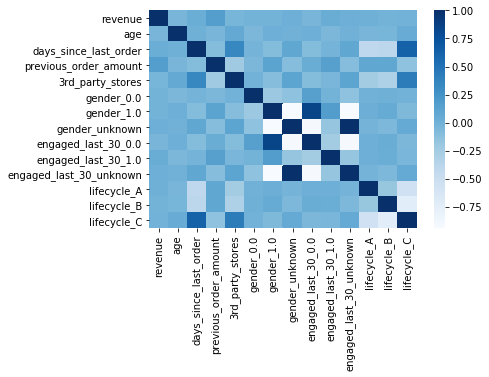

In [88]:
#cmap colormap(颜色映射)
sns.heatmap(red.corr(),cmap = 'Blues')

- lifecycle_C和days_since_last_order和3rd_party_stores两两正相关关系较强
- gender_1.0和engaged_last_30_0.0正相关关系较强
- revenue和其他任何变量之间的相关性都不明显

In [94]:
# 仅查看所有变量与revenue的相关性，同时根据相关性做降序排列展示
red.corr()[['revenue']].sort_values('revenue', ascending = False)

,revenue
revenue,1.000000
previous_order_amount,0.168540
engaged_last_30_1.0,0.038287
days_since_last_order,0.036654
gender_unknown,0.017722
engaged_last_30_unknown,0.017722
lifecycle_A,0.013683
lifecycle_C,-0.002221
lifecycle_B,-0.008651
gender_1.0,-0.012422


- revenue和其他任何变量之间的相关性都不明显
- 和revenue正相关性最高的是previous_order_amount, engaged_last_30_1.0, days_since_last_order
- 和revenue负相关性最高的是3rd_party_stores, engaged_last_30_0.0, gender
- 其他呈现弱相关关系的变量将不做解读，以免被过度解读


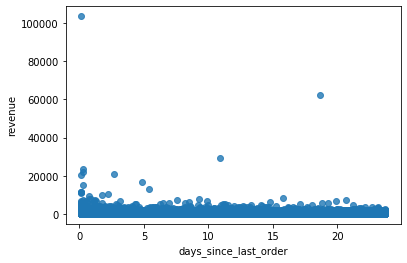

In [99]:
#对days_since_last_order变量进行线性关系可视化分析
sns.regplot('days_since_last_order','revenue',red)

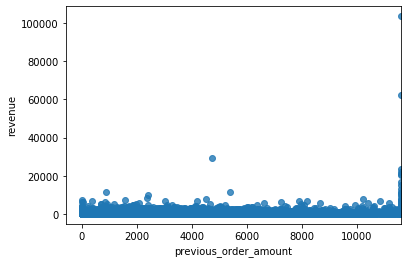

In [100]:
#对previous_order_amount变量进行线性关系可视化分析
sns.regplot('previous_order_amount','revenue',red)

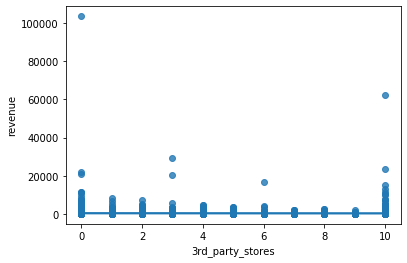

In [102]:
#对3rd_party_stores变量进行线性关系可视化分析
sns.regplot('3rd_party_stores','revenue',red)

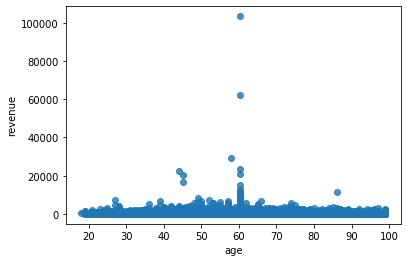

In [103]:
#对age变量进行线性关系可视化分析
sns.regplot('age','revenue',red)

# 4 回归模型

In [108]:
red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29452 entries, 0 to 29451
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   revenue                  29452 non-null  float64
 1   age                      29452 non-null  float64
 2   days_since_last_order    29452 non-null  float64
 3   previous_order_amount    29452 non-null  float64
 4   3rd_party_stores         29452 non-null  int64  
 5   gender_0.0               29452 non-null  uint8  
 6   gender_1.0               29452 non-null  uint8  
 7   gender_unknown           29452 non-null  uint8  
 8   engaged_last_30_0.0      29452 non-null  uint8  
 9   engaged_last_30_1.0      29452 non-null  uint8  
 10  engaged_last_30_unknown  29452 non-null  uint8  
 11  lifecycle_A              29452 non-null  uint8  
 12  lifecycle_B              29452 non-null  uint8  
 13  lifecycle_C              29452 non-null  uint8  
dtypes: float64(4), int64(1

## 4.1 模型评估

In [109]:
#导入模块
from sklearn.linear_model import LinearRegression
#建立一个空回归模型
model = LinearRegression()
#设定自变量和因变量
y = red['revenue']
x = red[['previous_order_amount','engaged_last_30_1.0','days_since_last_order']]
#拟合
model.fit(x,y)
#查看系数
model.coef_

array([ 0.06895217, 63.63927387,  7.62191879])

In [111]:
#查看截距
model.intercept_

174.7524798566112

## 4.2 模型评估

In [113]:
#给x和y打分
score = model.score(x,y)
#通过x计算y的预测值
predictions = model.predict(x)
#计算误差
error = predictions - y
#计算rmse
rmse = (error**2).mean()**.5
#计算mae
mae = abs(error).mean()

print(rmse)
print(mae)

945.1327326407895
352.9825670606425


MAE（Mean Absolute Error）:
- 绝对平均误差，是绝对误差的平均值
- 把每个数据点的预测值和真实值相见，将所有数据点加总求平均
- 可以更好地反映预测值误差的实际情况

RMSE（Root Mean Square Error）:
- 均方根误差，将每个数据点的误差取平方后开方
- RMSE比起MAE放大了误差，对误差的惩罚更重
- 常用来作为机器学习模型预测结果衡量的标准

In [115]:
from statsmodels.formula.api import ols
model = ols('y~x', red).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     316.2
Date:                Fri, 25 Sep 2020   Prob (F-statistic):          4.33e-202
Time:                        23:04:03   Log-Likelihood:            -2.4358e+05
No. Observations:               29452   AIC:                         4.872e+05
Df Residuals:                   29448   BIC:                         4.872e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    174.7525     10.466     16.697      0.0

- R-squared为0.031，Prob为0
- 该回归基本无意义

## 4.2 模型迭代优化

In [121]:
#新增自变量lifecycle_C
#导入模块
from sklearn.linear_model import LinearRegression
#建立一个空回归模型
model = LinearRegression()
#设定自变量和因变量
y = red['revenue']
x = red[['previous_order_amount','engaged_last_30_1.0','days_since_last_order','lifecycle_C']]
#拟合
model.fit(x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [122]:
#给x和y打分
score = model.score(x,y)
#通过x计算y的预测值
predictions = model.predict(x)
#计算误差
error = predictions - y
#计算rmse
rmse = (error**2).mean()**.5
#计算mae
mae = abs(error).mean()

print(rmse)
print(mae)

945.0664751321252
352.6020358581729


In [128]:
from statsmodels.formula.api import ols
model = ols('y~x', red).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     238.2
Date:                Fri, 25 Sep 2020   Prob (F-statistic):          1.07e-201
Time:                        23:11:59   Log-Likelihood:            -2.4357e+05
No. Observations:               29452   AIC:                         4.872e+05
Df Residuals:                   29447   BIC:                         4.872e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    186.8375     12.038     15.521      0.0

#### 销售额模型预计分析：
预计销售额 = 186.8375+0.0684*previous_order_amount+62.6521*engaged_last_30_1.0+8.9856*days_since_last_order-31.0249*lifecycle_C

# 5 业务建议

## 5.1 用户分析

- 用户年龄分布在18 - 99岁之间，用户年龄平均值为60.39岁，用户年龄中位数为60.39岁，绝大部分用户年龄集中在58 = 63岁之间
- 用户年龄在平均值两侧呈对称分布
- 29452个用户的年龄为60.3岁，60岁或是小红书的默认年龄选项

## 5.2 提高销售额变量分析 - 高价值用户

- C(注册后两年)的用户最多
- A(注册后6个月内的)用户销售额平均值最高，为433.8；其次是C(注册后两年)用户，销售额平均值为396.8；销售额平均值最低的是B(注册后一年内的)用户，销售额平均值为381.3
- C用户销售额总和最高,其次是B用户,销售额总和最低的是A用户
- 总销售额大部分由C的用户创造


- 从未在第三方APP购买过的顾客最多，其次是在第三方APP购买过10次的顾客
- 从未在第三方APP购买过的顾客的平均销售额最多；在第三方APP进行了1 - 5次购买的顾客的平均销售额差不多；在第三方APP进行了6 - 10次购买的顾客的平均销售额差不多,不过后者大于在第三方APP进行了1 - 5次购买的顾客的平均销售额
- 总销售额大部分由从未在第三方APP购买过的用户贡献，其次是在第三方APP购买过10次的用户，再次是在第三方APP进行了1 - 5次购买的顾客，贡献最少的是在第三方APP进行6 - 10次购买的顾客


- lifecycle_C和days_since_last_order和3rd_party_stores两两正相关关系较强
- gender_1.0和engaged_last_30_0.0正相关关系较强
- revenue和其他任何变量之间的相关性都不明显

## 5.3 结论

- 重点留意注册后两年用户的留存情况
- 活动、广告、营销重点针对男性用户
- 鼓励用户在APP上参加活动，特别是男性用户
- 针对从未在第三方APP进行过购买活动的用户进行额外推送、广告、营销、优惠券推送等，其次是在第三方APP进行购买活动大于等于10次的用户

# 6 模型解读

### 6.1 系数解读

#### 销售额模型预计分析：
预计销售额 = 186.8375+0.0684*previous_order_amount+62.6521*engaged_last_30_1.0+8.9856*days_since_last_order-31.0249*lifecycle_C

- previous_order_amount：用户以往累计购买金额
- engaged_last_30_1.0：用户在最近30天内参加过了活动：1，未参加活动：0
- days_since_last_order：用户最近一次下单距今的天数
- lifecycle_C：用户是在两年前注册：1，不是在两年前注册：0

### 6.2 业务解读

- 每提升1元的用户以往累积购买金额，可以得到0.06元的销售额回报
- 用户用户在最近30天内参加过活动比起不参加活动，销售额提升了62.65元
- 用户最近一次下单距今的天数每提升1天，则可以实现8.98元的销售回报
- 用户在两年前注册比起不在两年前注册，销售额降低了31.02元
- 不断收集数据和添加新变量能提升对整体营销资源投入的把握
（注：该数据线性回归效果较差，仅为练习线性回归步骤用）